# Python Refresher - Part 2

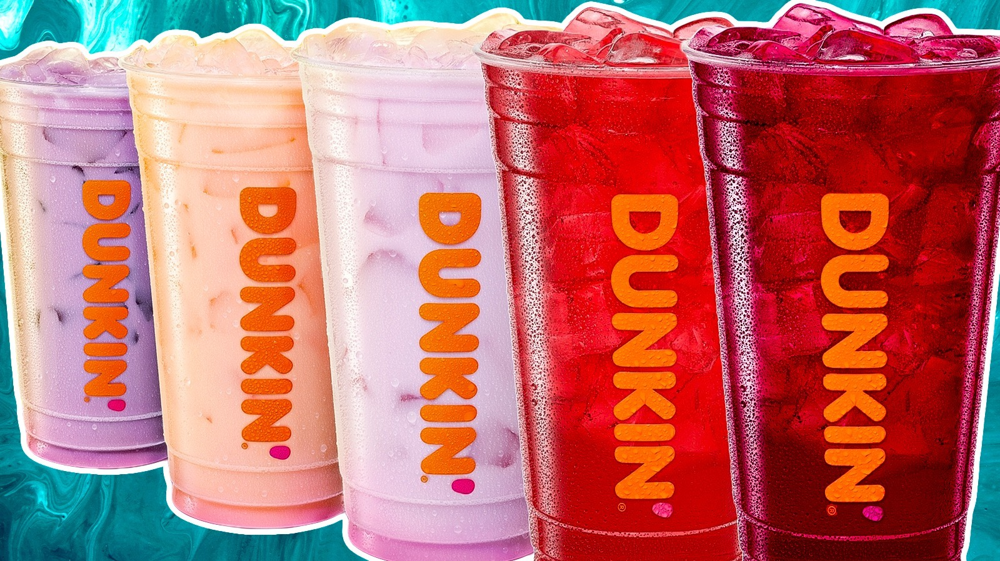

# Methods

Methods are essentially functions built into objects. They perform specific actions on an object and can also take arguments, just like a function.

Methods are in the form:

    object.method(arg1,arg2,etc...)
    
You'll later see that we can think of methods as having an argument 'self' referring to the object itself.

In [1]:
# Create a simple list
nums = [1,2,3,4,5,6,7]

The methods for a list are:

* append
* count
* extend
* insert
* pop
* remove
* reverse
* sort

append() allows us to add elements to the end of a list:

In [2]:
nums.append(8)

In [3]:
nums

[1, 2, 3, 4, 5, 6, 7, 8]

You can always use Shift+Tab in the Jupyter Notebook to get more help about the method. In general Python you can use the help() function: 

In [4]:
help(nums.count)

Help on built-in function count:

count(value, /) method of builtins.list instance
    Return number of occurrences of value.



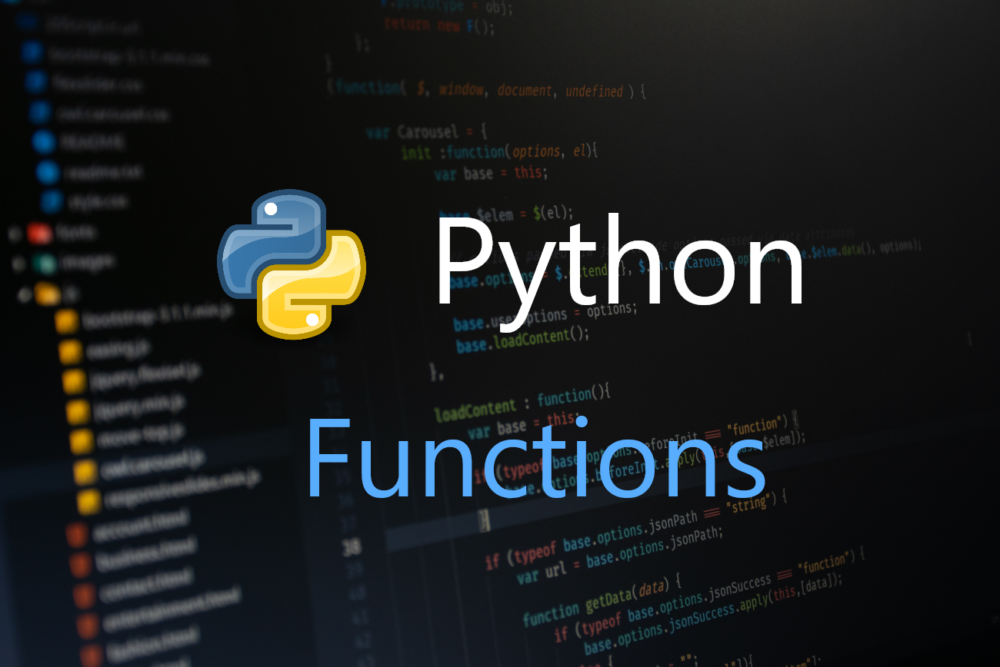

# Functions

## Introduction to Functions

Formally, a function groups together a set of statements so they can be run more than once.

In [5]:
def name_of_function(arg1,arg2):
    '''
    This is where the function's Document String (docstring) goes
    '''
    # Do stuff here
    # Return desired result

### Example 1: A simple print 'hello' function

In [6]:
def say_hello():
    print('hello')

Call the function:

In [7]:
say_hello()

hello


### Example 2: A simple greeting function
Let's write a function that greets people with their name.

In [8]:
def greeting(name):
    print('Hello {}.'.format(name))

In [9]:
greeting('Kira')

Hello Kira.


## Using return
Let's see some example that use a <code>return</code> statement. <code>return</code> allows a function to *return* a result that can then be stored as a variable, or used in whatever manner a user wants.

### Example 3: Addition function

In [10]:
def add_num(num1,num2):
    return num1+num2

In [11]:
add_num(4,5)

9

In [12]:
# Can also save as variable due to return
result = add_num(4,5)

In [13]:
print(result)

9


Let's also start using <code>break</code>, <code>continue</code>, and <code>pass</code> statements in our code.

In [15]:
def is_prime(num):
    '''
    Naive method of checking for primes. 
    '''
    for n in range(2,num):
        if num % n == 0:
            print(num,'is not prime')
            break
    else: # If never mod zero, then prime
        print(num,'is prime!')

In [16]:
is_prime(16)

16 is not prime


In [17]:
is_prime(17)

17 is prime!


We can actually improve this function by only checking to the square root of the target number, and by disregarding all even numbers after checking for 2. We'll also switch to returning a boolean value.

In [18]:
import math

def is_prime2(num):
    '''
    Better method of checking for primes. 
    '''
    if num % 2 == 0 and num > 2: 
        return False
    for i in range(3, int(math.sqrt(num)) + 1, 2):
        if num % i == 0:
            return False
    return True

In [19]:
is_prime2(18)

False

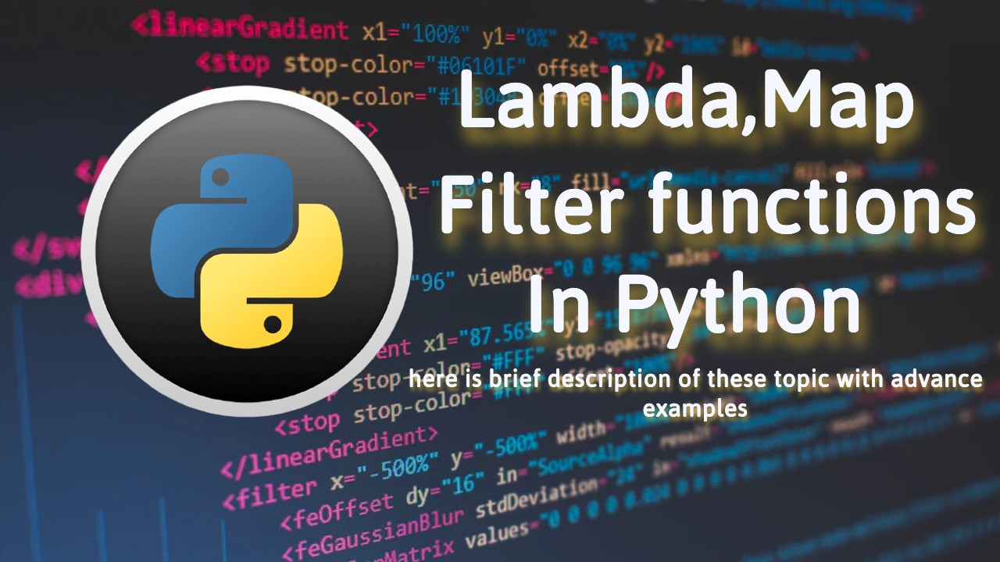

# Map, Filter, and Lambda Expressions

Now its time to quickly learn about two built in functions, filter and map. Once we learn about how these operate, we can learn about the lambda expression, which will come in handy when you begin to develop your skills further!

## map function

The **map** function allows you to "map" a function to an iterable object. That is to say you can quickly call the same function to every item in an iterable, such as a list. For example:

In [49]:
def square_the_num(num):
    return num**2

In [50]:
nums_list = [1,2,3,4,5]

In [51]:
# To get the results, just cast to a list
list(map(square_the_num,nums_list))

[1, 4, 9, 16, 25]

The functions can also be more complex

In [52]:
def splicer(mystring):
    if len(mystring) % 2 == 0:
        return 'even'
    else:
        return mystring[0]

In [53]:
mynames = ['John','Cindy','Sarah','Kelly','Mike']

In [54]:
list(map(splicer,mynames))

['even', 'C', 'S', 'K', 'even']

## filter function

The filter function returns an iterator yielding those items of iterable for which function(item)
is true. Meaning you need to filter by a function that returns either True or False. Then passing that into filter (along with your iterable) and you will get back only the results that would return True when passed to the function.

In [55]:
def check_if_even(num):
    return num % 2 == 0 

In [56]:
nums = [0,1,2,3,4,5,6]

In [57]:
list(filter(check_if_even,nums))

[0, 2, 4, 6]

## lambda expression

One of Pythons most useful (and for beginners, confusing) tools is the lambda expression.

**lambda's body is a single expression, not a block of statements.**

*lambda* is designed for coding simple functions, while *def* handles the larger tasks.

Lets break down a lambda expression by deconstructing a function:

In [60]:
def square(num):
    return num**2

In [61]:
square(2)

4

We could actually even write this all on one line.

In [62]:
def square(num): return num**2

In [63]:
square(2)

4

This is the form a function that a lambda expression intends to replicate. A lambda expression can then be written as:

In [64]:
lambda num: num ** 2

<function __main__.<lambda>(num)>

So why would use this? Many function calls need a function passed in, such as map and filter. Often you only need to use the function you are passing in once, so instead of formally defining it, you just use the lambda expression. Let's repeat some of the examples from above with a lambda expression

In [67]:
list(map(lambda num: num ** 2, nums_list))

[1, 4, 9, 16, 25]

In [68]:
list(filter(lambda n: n % 2 == 0,nums_list))

[2, 4]

Here are a few more examples, keep in mind the more comples a function is, the harder it is to translate into a lambda expression, meaning sometimes its just easier (and often the only way) to create the def keyword function.

** Lambda expression for grabbing the first character of a string: **

In [69]:
lambda s: s[0]

<function __main__.<lambda>(s)>

** Lambda expression for reversing a string: **

In [70]:
lambda s: s[::-1]

<function __main__.<lambda>(s)>

You can even pass in multiple arguments into a lambda expression. Again, keep in mind that not every function can be translated into a lambda expression.

In [71]:
lambda x,y : x + y

<function __main__.<lambda>(x, y)>

You will find yourself using lambda expressions often with certain non-built-in libraries, for example the pandas library for data analysis works very well with lambda expressions.

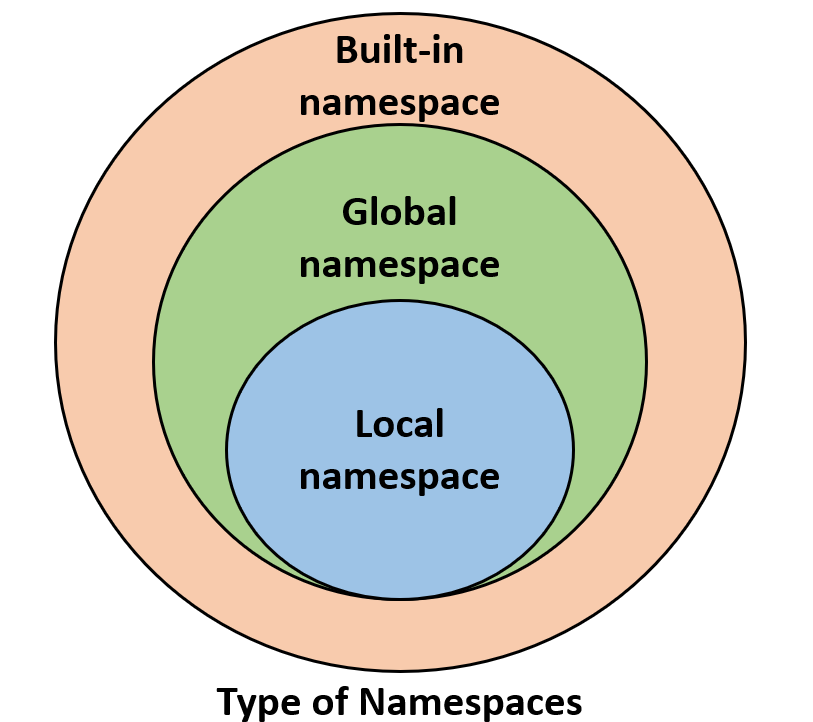

# Nested Statements and Scope 

Now that we have gone over writing our own functions, it's important to understand how Python deals with the variable names you assign. When you create a variable name in Python the name is stored in a *name-space*. Variable names also have a *scope*, the scope determines the visibility of that variable name to other parts of your code.

Let's start with a quick thought experiment; imagine the following code:

In [91]:
x = 10

def print_x_value():
    x = 25
    return x

# print(x)
# print(print_x_value())
# print(x)

10
25
10


Interesting! But how does Python know which **x** you're referring to in your code? This is where the idea of scope comes in. Python has a set of rules it follows to decide what variables (such as **x** in this case) you are referencing in your code.

## Local Variables
When you declare variables inside a function definition, they are not related in any way to other variables with the same names used outside the function - i.e. variable names are local to the function. This is called the scope of the variable. All variables have the scope of the block they are declared in starting from the point of definition of the name.

Example:

In [75]:
x = 50

def func(x):
    print('x is', x)
    x = 2
    print('Changed local x to', x)

func(x)
print('x is still', x)

x is 50
Changed local x to 2
x is still 50


## The <code>global</code> statement
If you want to assign a value to a name defined at the top level of the program (i.e. not inside any kind of scope such as functions or classes), then you have to tell Python that the name is not local, but it is global. We do this using the <code>global</code> statement.

In [76]:
x = 50

def func():
    global x
    print('This function is now using the global x!')
    print('Because of global x is: ', x)
    x = 2
    print('Ran func(), changed global x to', x)

print('Before calling func(), x is: ', x)
func()
print('Value of x (outside of func()) is: ', x)

Before calling func(), x is:  50
This function is now using the global x!
Because of global x is:  50
Ran func(), changed global x to 2
Value of x (outside of func()) is:  2


You can specify more than one global variable using the same global statement e.g. <code>global x, y, z</code>.

## Conclusion
You should now have a good understanding of Scope (you may have already intuitively felt right about Scope which is great!) One last mention is that you can use the **globals()** and **locals()** functions to check what are your current local and global variables.

Another thing to keep in mind is that everything in Python is an object! I can assign variables to functions just like I can with numbers! We will go over this again in the decorator section of the course!

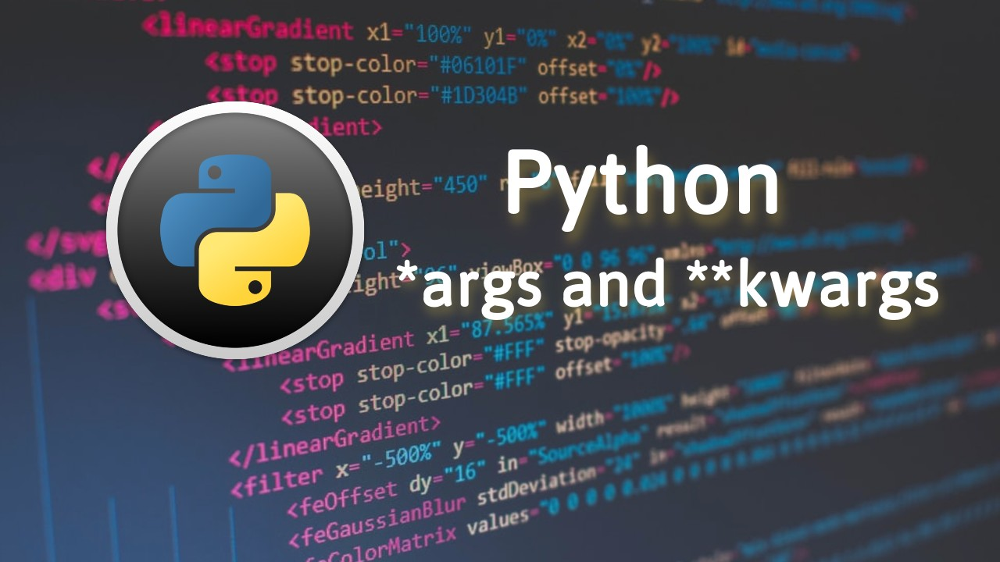

# `*args` and `**kwargs`

## `*args`

When a function parameter starts with an asterisk, it allows for an *arbitrary number* of arguments, and the function takes them in as a tuple of values. Rewriting the above function:

In [95]:
def double_their_sum(*args):
    return sum(args)*2

double_their_sum(40,60,20,80)

400

Notice how passing the keyword "args" into the `sum()` function did the same thing as a tuple of arguments.

## `**kwargs`

Similarly, Python offers a way to handle arbitrary numbers of *keyworded* arguments. Instead of creating a tuple of values, `**kwargs` builds a dictionary of key/value pairs. For example:

In [81]:
def double_all_scores(**kwargs):
    for key, value in kwargs.items():
        print(key,2*value)
        
double_all_scores(test1=90,test2=70,test3=100)

test1 180
test2 140
test3 200


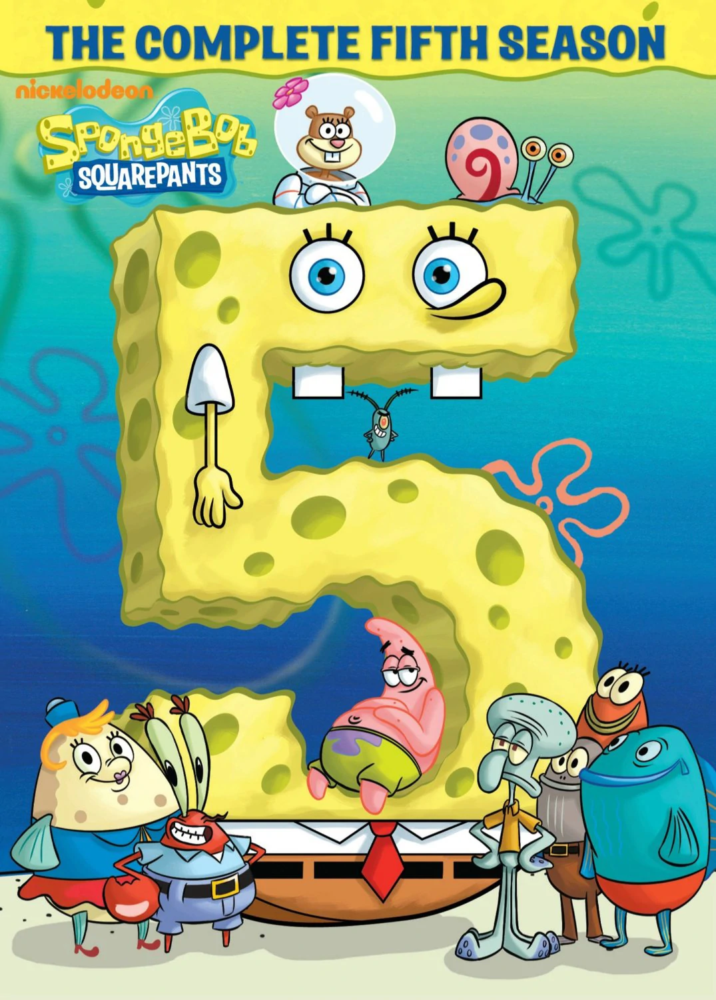

*This notebook contains an excerpt from the [Whirlwind Tour of Python](http://www.oreilly.com/programming/free/a-whirlwind-tour-of-python.csp) by Jake VanderPlas; the content is available [on GitHub](https://github.com/jakevdp/WhirlwindTourOfPython).*

*The text and code are released under the [CC0](https://github.com/jakevdp/WhirlwindTourOfPython/blob/master/LICENSE) license; see also the companion project, the [Python Data Science Handbook](https://github.com/jakevdp/PythonDataScienceHandbook).*


# Modules and Packages

## Loading Modules: the ``import`` Statement

For loading built-in and third-party modules, Python provides the ``import`` statement.
There are a few ways to use the statement, which we will mention briefly here, from most recommended to least recommended.

### Explicit module import

Explicit import of a module preserves the module's content in a namespace.
The namespace is then used to refer to its contents with a "``.``" between them.
For example:

In [1]:
import math
math.sin(math.pi/2)

1.0

### Explicit module import by alias

For longer module names, it's not convenient to use the full module name each time you access some element.
For this reason, we'll commonly use the "``import ... as ...``" pattern to create a shorter alias for the namespace.

In [2]:
import numpy as np
np.sin(np.pi/2)

1.0

### Explicit import of module contents

Sometimes rather than importing the module namespace, you would just like to import a few particular items from the module.
This can be done with the "``from ... import ...``" pattern.
For example, we can import just the ``cos`` function and the ``pi`` constant from the ``math`` module:

In [3]:
from math import cos, pi
cos(pi)

-1.0

## Importing from Python's Standard Library

Python's standard library contains many useful built-in modules, which you can read about fully in [Python's documentation](https://docs.python.org/3/library/).
Any of these can be imported with the ``import`` statement, and then explored using the help function seen in the previous section.
Here is an extremely incomplete list of some of the modules you might wish to explore and learn about:

- ``os`` and ``sys``: Tools for interfacing with the operating system, including navigating file directory structures and executing shell commands
- ``math`` and ``cmath``: Mathematical functions and operations on real and complex numbers
- ``itertools``: Tools for constructing and interacting with iterators and generators
- ``functools``: Tools that assist with functional programming
- ``random``: Tools for generating pseudorandom numbers
- ``pickle``: Tools for object persistence: saving objects to and loading objects from disk
- ``json`` and ``csv``: Tools for reading JSON-formatted and CSV-formatted files.
- ``urllib``: Tools for doing HTTP and other web requests.

You can find information on these, and many more, in the Python standard library documentation: https://docs.python.org/3/library/.

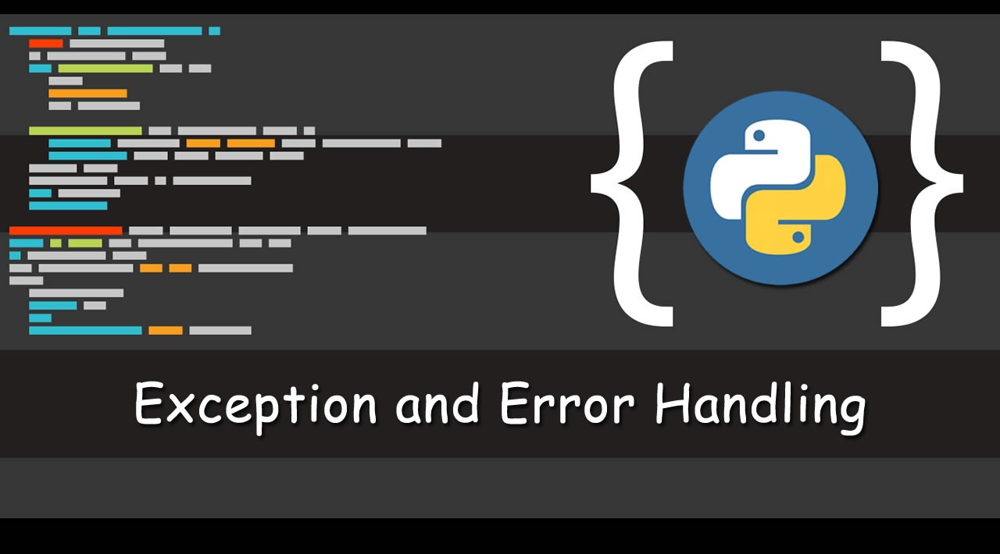

# Errors and Exception Handling

## try and except

The basic terminology and syntax used to handle errors in Python are the <code>try</code> and <code>except</code> statements. The code which can cause an exception to occur is put in the <code>try</code> block and the handling of the exception is then implemented in the <code>except</code> block of code. The syntax follows:

    try:
       You do your operations here...
       ...
    except ExceptionI:
       If there is ExceptionI, then execute this block.
    except ExceptionII:
       If there is ExceptionII, then execute this block.
       ...
    else:
       If there is no exception, then execute this block. 

We can also just check for any exception with just using <code>except:</code> To get a better understanding of all this let's check out an example.

In [6]:
try:
    f = open('testfile','w')
    f.write('Test write this')
except IOError:
    # This will only check for an IOError exception
    print("Error: Could not find file or read data")
else:
    print("Content written successfully")
    f.close()

Content written successfully


## finally
The <code>finally:</code> block of code will always be run regardless if there was an exception in the <code>try</code> code block. The syntax is:

In [12]:
def askint():
    while True:
        try:
            val = int(input("Please enter an integer: "))
        except:
            print("Looks like you did not enter an integer!")
            continue
        else:
            print("Yep that's an integer!")
            break
    print(val)

In [13]:
askint()

Please enter an integer: pizza
Looks like you did not enter an integer!
Please enter an integer: pizza
Looks like you did not enter an integer!
Please enter an integer: 3
Yep that's an integer!
3


**Great! Now you know how to handle errors and exceptions in Python with the try, except, else, and finally notation!**

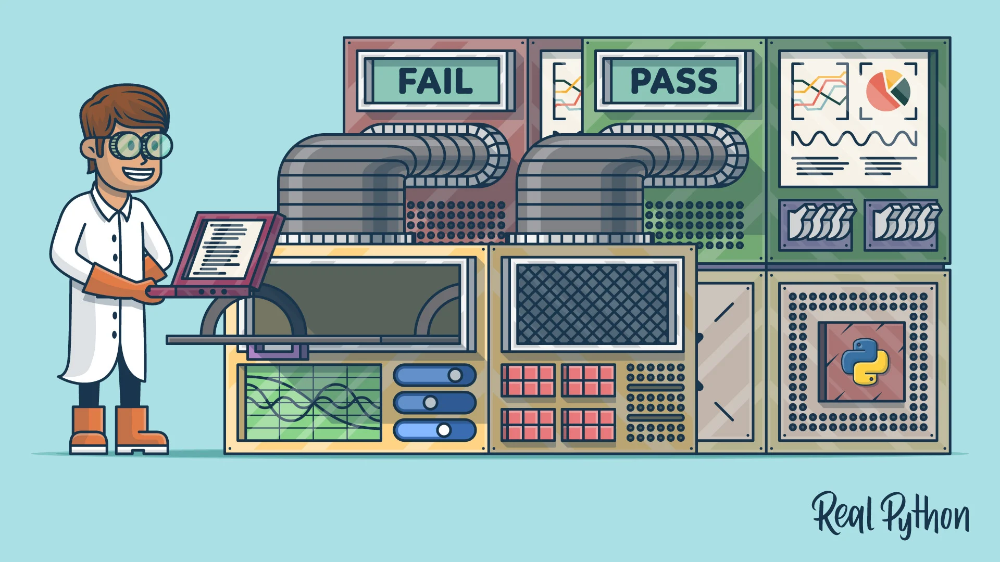

# Unit Testing

Equally important as writing good code is writing good tests. Better to find bugs yourself than have them reported to you by end users!

For this section we'll be working with files outside the notebook. We'll save our code to a .py file, and then save our test script to another .py file. Normally we would code these files using a text editor like Brackets or Atom, or inside an IDE like Spyder or Pycharm. But, since we're here, let's use Jupyter!

Recall that with some IPython magic we can write the contents of a cell to a file using `%%writefile`.<br>
#### Something we haven't seen yet; you can run terminal commands from a jupyter cell using `!`

## Testing tools

There are dozens of good testing libraries out there. Most are third-party packages that require an install, such as:

* [pylint](https://www.pylint.org/)
* [pyflakes](https://pypi.python.org/pypi/pyflakes/)
* [pep8](https://pypi.python.org/pypi/pep8)

These are simple tools that merely look at your code, and they'll tell you if there are style issues or simple problems like variable names being called before assignment.

A far better way to test your code is to write tests that send sample data to your program, and compare what's returned to a desired outcome.<br>Two such tools are available from the standard library:

* [unittest](https://docs.python.org/3/library/unittest.html)
* [doctest](https://docs.python.org/3/library/doctest.html)

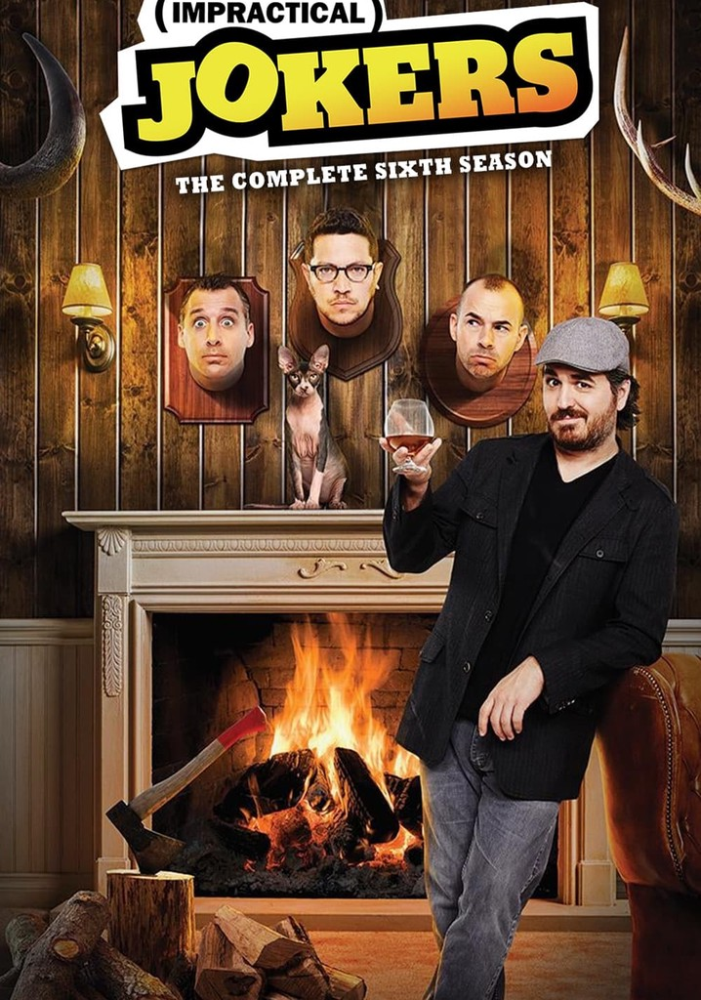

# Object Oriented Programming

Object Oriented Programming (OOP) tends to be one of the major obstacles for beginners when they are first starting to learn Python.

## Objects
In Python, *everything is an object*.

## class
The user defined objects are created using the class keyword. The class is a blueprint that defines a nature of a future object. From classes we can construct instances. An instance is a specific object created from a particular class.

In [2]:
# Create a new object type called Sample
class Sample(object):
    pass

# Instance of Sample
x = Sample()

print type(x)

<class '__main__.Sample'>


By convention we give classes a name that starts with a capital letter.

An **attribute** is a characteristic of an object.
A **method** is an operation we can perform with the object.


## Attributes
The syntax for creating an attribute is:
    
    self.attribute = something
    
There is a special method called:

    __init__()

This method is used to initialize the attributes of an object and is analogous to a constructor in Java. For example:

In [3]:
class Dog(object):
    def __init__(self,breed):
        self.breed = breed
        
sam = Dog(breed='Lab')
frank = Dog(breed='Huskie')

Lets break down what we have above.The special method 

    __init__() 
is called automatically right after the object has been created:

    def __init__(self, breed):
Each attribute in a class definition begins with a reference to the instance object. It is by convention named self. The breed is the argument. The value is passed during the class instantiation.

     self.breed = breed

Now we have created two instances of the Dog class. With two breed types, we can then access these attributes like this:

In [11]:
sam.breed

'Lab'

In [9]:
frank.breed

'Huskie'

In [4]:
class Dog(object):
    
    # Class Object Attribute
    species = 'mammal'
    
    def __init__(self,breed,name):
        self.breed = breed
        self.name = name

In [5]:
sam = Dog('Lab','Sam')

In [6]:
sam.name

'Sam'

In [7]:
sam.species

'mammal'

## Methods

Methods are functions defined inside the body of a class. You can basically think of methods as functions acting on an Object that take the Object itself into account through its *self* argument.

In [8]:
class Circle(object):
    pi = 3.14

    # Circle get instantiated with a radius (default is 1)
    def __init__(self, radius=1):
        self.radius = radius 

    # Area method calculates the area. Note the use of self.
    def area(self):
        return self.radius * self.radius * Circle.pi

    # Method for resetting Radius
    def setRadius(self, radius):
        self.radius = radius

    # Method for getting radius (Same as just calling .radius)
    def getRadius(self):
        return self.radius


c = Circle()

c.setRadius(2)
print ('Radius is: ',c.getRadius())
print ('Area is: ',c.area())

Radius is:  2
Area is:  12.56


## Special Methods
Finally lets go over special methods. Classes in Python can implement certain operations with special method names. These methods are not actually called directly but by Python specific language syntax. For example Lets create a Book class:

In [14]:
class Book():
    def __init__(self, title, author, pages):
        print ("A book is created")
        self.title = title
        self.author = author
        self.pages = pages

    def __str__(self):
        return "Title:%s , author:%s, pages:%s " %(self.title, self.author, self.pages)

    def __len__(self):
        return self.pages

    def __del__(self):
        print ("A book is destroyed")

In [15]:
book = Book("Python Rocks!", "Jose Portilla", 159)

#Special Methods
print (book)
print (len(book))
del book

A book is created
Title:Python Rocks! , author:Jose Portilla, pages:159 
159
A book is destroyed


    The __init__(), __str__(), __len__() and the __del__() methods.
These special methods are defined by their use of underscores. They allow us to use Python specific functions on objects created through our class.